In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture 

from scipy.stats import kurtosis
from scipy.stats import skew 
import statistics

# Variation of features in all 519 files

In [2]:
files = []
for r, d, f in os.walk('./Blade Life/Data'):
   for item in f:
    files.append(os.path.join(r, item))

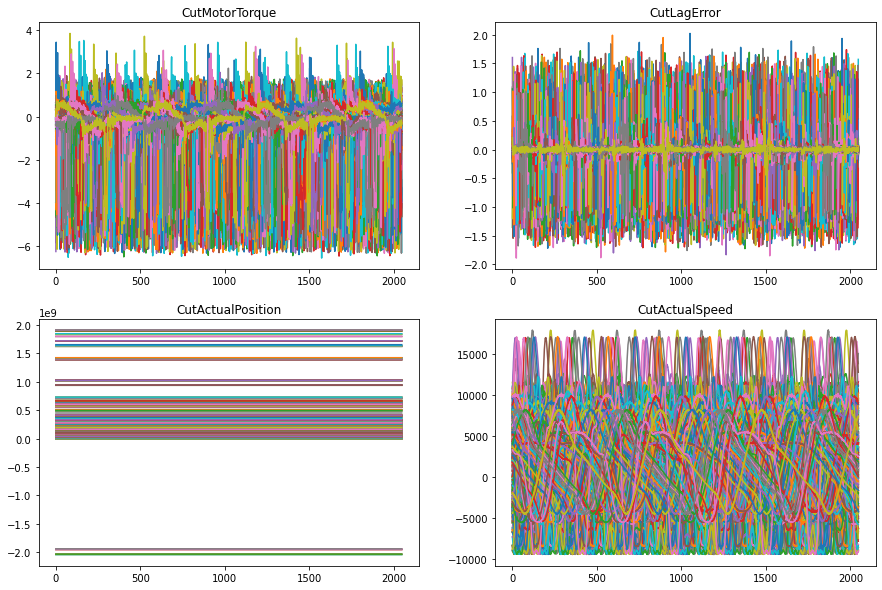

In [29]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    axes[0][0].plot(df['CutMotorTorque'])
    axes[0][1].plot(df['CutLagError'])
    axes[1][0].plot(df['CutActualPosition'])
    axes[1][1].plot(df['CutActualSpeed'])
    
axes[0][0].title.set_text('CutMotorTorque')
axes[0][1].title.set_text('CutLagError')
axes[1][0].title.set_text('CutActualPosition')
axes[1][1].title.set_text('CutActualSpeed')
plt.show()

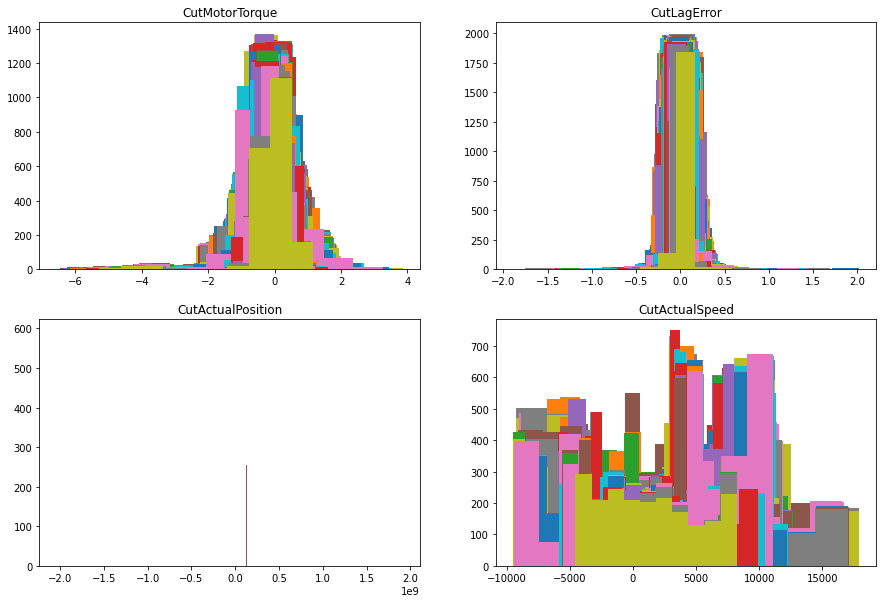

In [30]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    axes[0][0].hist(df['CutMotorTorque'])
    axes[0][1].hist(df['CutLagError'])
    axes[1][0].hist(df['CutActualPosition'])
    axes[1][1].hist(df['CutActualSpeed'])
    
axes[0][0].title.set_text('CutMotorTorque')
axes[0][1].title.set_text('CutLagError')
axes[1][0].title.set_text('CutActualPosition')
axes[1][1].title.set_text('CutActualSpeed')
plt.show()

In [30]:
# performing PCA on each file and finding its descriptive statistics

pca = PCA(n_components = 4)

# for PCA1 and PCA2
kurtosis1 = []
kurtosis2 = []
skewness1 = []
skewness2 = []
sd1 = []
sd2 = []
variance1 = []
variance2 = []

In [32]:
# since PCA1 and PCA2 hava significant values, lets perform further analysis using the same
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)
    
    principal_components = pca.fit_transform(df)
    df_pca = pd.DataFrame(data = principal_components, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])
    
    kurtosis1.append(kurtosis(np.array(df_pca['PCA1'])))
    kurtosis2.append(kurtosis(np.array(df_pca['PCA2'])))
    skewness1.append(skew(np.array(df_pca['PCA1'])))
    skewness2.append(skew(np.array(df_pca['PCA2'])))
    sd1.append(statistics.stdev(np.array(df_pca['PCA1'])))
    sd2.append(statistics.stdev(np.array(df_pca['PCA2'])))
    variance1.append(statistics.variance(np.array(df_pca['PCA1'])))
    variance2.append(statistics.variance(np.array(df_pca['PCA2'])))

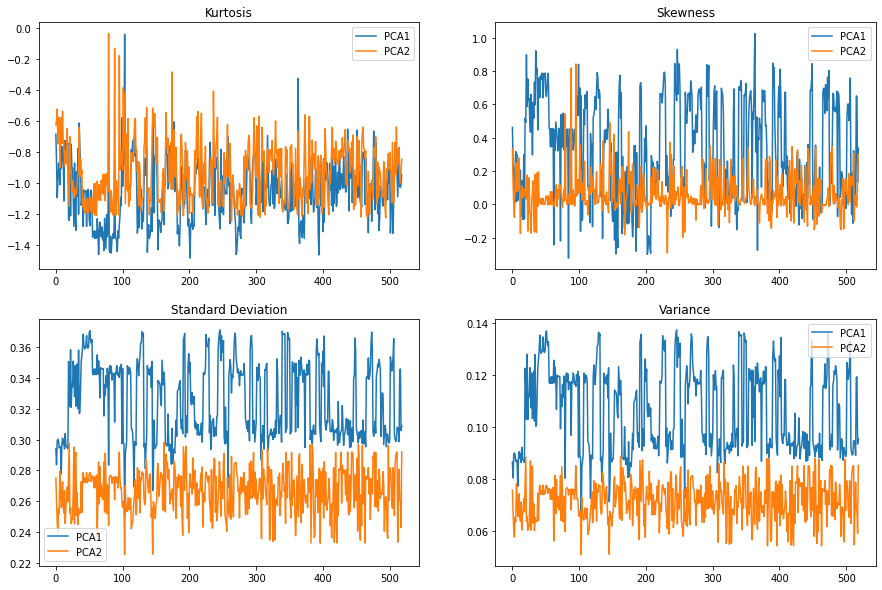

In [45]:
# visulaising descriptive stats
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 1. kurtosis
axes[0][0].plot(kurtosis1)
axes[0][0].plot(kurtosis2)
axes[0][0].legend(['PCA1', 'PCA2'])
axes[0][0].title.set_text('Kurtosis')

# 2. skewness
axes[0][1].plot(skewness1)
axes[0][1].plot(skewness2)
axes[0][1].legend(['PCA1', 'PCA2'])
axes[0][1].title.set_text('Skewness') 

# 3. sd
axes[1][0].plot(sd1)
axes[1][0].plot(sd2)
axes[1][0].legend(['PCA1', 'PCA2'])
axes[1][0].title.set_text('Standard Deviation') 

# 4. variance
axes[1][1].plot(variance1)
axes[1][1].plot(variance2)
axes[1][1].legend(['PCA1', 'PCA2'])
axes[1][1].title.set_text('Variance') 


plt.show()

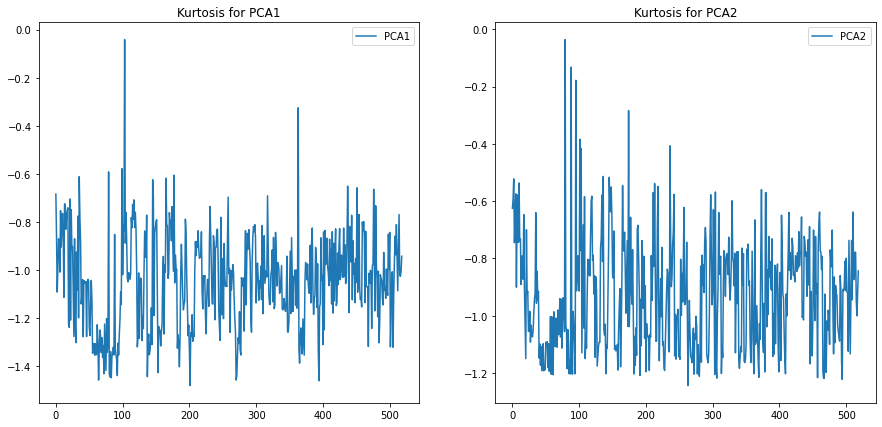

In [49]:
# visualising kurtosis alone 
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

axes[0].plot(kurtosis1)
axes[0].legend(['PCA1'])
axes[0].title.set_text('Kurtosis for PCA1')

axes[1].plot(kurtosis2)
axes[1].legend(['PCA2'])
axes[1].title.set_text('Kurtosis for PCA2')

plt.show()

# Comparison with new blade

In [10]:
new_blade = pd.read_csv('./Blade New/Data/NewBlade001.csv')

In [11]:
new_blade.head()

,Timestamp,pCut Motor: Torque,pCut CTRL Position controller: Lag error,pCut CTRL Position controller: Actual position,pCut CTRL Position controller: Actual speed,pSvolFilm CTRL Position controller: Actual position,pSvolFilm CTRL Position controller: Actual speed,pSvolFilm CTRL Position controller: Lag error
0,-0.188,-0.112131,-0.002490,-884606,0.000000,11128,2.504289,0.261085
1,-0.184,-0.088931,-0.003863,-884606,17.166138,11128,-2.504289,0.260083
2,-0.180,-0.115141,0.001630,-884606,-6.866455,11128,7.513016,0.259081
3,-0.176,-0.111815,0.003003,-884606,-13.732910,11128,-2.504289,0.260083
4,-0.172,-0.130970,0.004376,-884606,-6.866455,11128,0.000000,0.261085


In [12]:
scaler = MinMaxScaler() 
scaled = scaler.fit_transform(new_blade)
new_blade = pd.DataFrame(scaled, columns = new_blade.columns)

In [13]:
new_blade.head()

,Timestamp,pCut Motor: Torque,pCut CTRL Position controller: Lag error,pCut CTRL Position controller: Actual position,pCut CTRL Position controller: Actual speed,pSvolFilm CTRL Position controller: Actual position,pSvolFilm CTRL Position controller: Actual speed,pSvolFilm CTRL Position controller: Lag error
0,0.000000,0.752139,0.594529,0.018434,0.211568,0.0,0.004825,0.003281
1,0.000489,0.760143,0.592932,0.018434,0.215373,0.0,0.002413,0.001641
2,0.000977,0.751100,0.599321,0.018434,0.210046,0.0,0.007238,0.000000
3,0.001466,0.752248,0.600919,0.018434,0.208524,0.0,0.002413,0.001641
4,0.001954,0.745639,0.602516,0.018434,0.210046,0.0,0.003619,0.003281


In [14]:
new_blade.rename(columns={"Timestamp":"Time Elapsed",
                         "pCut Motor: Torque":"CutMotorTorque",
                         " pCut CTRL Position controller: Lag error": "CutLagError",
                         " pCut CTRL Position controller: Actual position" :"CutActualPosition",
                         " pCut CTRL Position controller: Actual speed":"CutActualSpeed",
                         " pSvolFilm CTRL Position controller: Actual position":"FilmActualPosition",
                         " pSvolFilm CTRL Position controller: Actual speed":"FilmActualSpeed",
                         " pSvolFilm CTRL Position controller: Lag error":"FilmLagError"},
                inplace=True)

In [15]:
new_blade.head()

,Time Elapsed,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed,FilmActualPosition,FilmActualSpeed,FilmLagError
0,0.000000,0.752139,0.594529,0.018434,0.211568,0.0,0.004825,0.003281
1,0.000489,0.760143,0.592932,0.018434,0.215373,0.0,0.002413,0.001641
2,0.000977,0.751100,0.599321,0.018434,0.210046,0.0,0.007238,0.000000
3,0.001466,0.752248,0.600919,0.018434,0.208524,0.0,0.002413,0.001641
4,0.001954,0.745639,0.602516,0.018434,0.210046,0.0,0.003619,0.003281


In [16]:
print('Corelation b/w Speed and Torque', new_blade['CutActualSpeed'].corr(new_blade['CutMotorTorque']))
print('Corelation b/w Position and Lag errror', new_blade['CutActualPosition'].corr(new_blade['CutLagError']))

Corelation b/w Speed and Torque -0.786212513260376
Corelation b/w Position and Lag errror -0.0006652907799379565


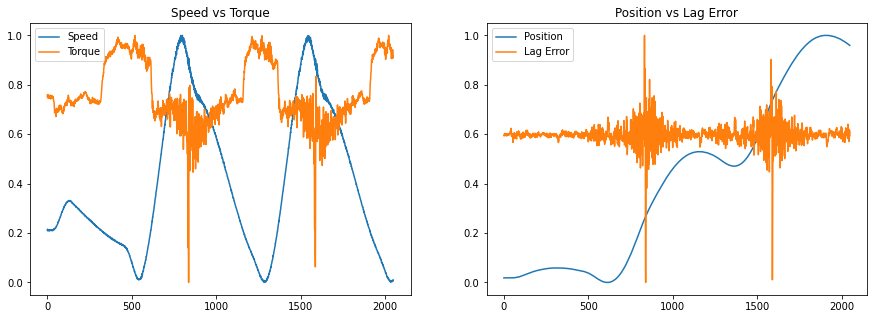

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(new_blade['CutActualSpeed'])
axes[0].plot(new_blade['CutMotorTorque'])
axes[0].legend(['Speed', 'Torque'])
axes[0].title.set_text('Speed vs Torque')

axes[1].plot(new_blade['CutActualPosition'])
axes[1].plot(new_blade['CutLagError'])
axes[1].legend(['Position', 'Lag Error'])
axes[1].title.set_text('Position vs Lag Error')

plt.show()

<b>Comparing with cut features</b>

In [12]:
compare_new_cut = pd.DataFrame(columns = ['File', 'Mode', 'Month', 'CutMotorTorque', 'CutLagError','CutActualPosition', 'CutActualSpeed'])
compare_new_cut 

,File,Mode,Month,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed


In [31]:
new_blade_cut = new_blade.iloc[:, 1:5]

In [32]:
new_blade_cut.head()

,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed
0,0.752139,0.594529,0.018434,0.211568
1,0.760143,0.592932,0.018434,0.215373
2,0.751100,0.599321,0.018434,0.210046
3,0.752248,0.600919,0.018434,0.208524
4,0.745639,0.602516,0.018434,0.210046


In [33]:
features = new_blade_cut.columns

In [16]:
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)

    s = str(file)
    month = s[18:20]
    mode = s[39]
    fileno = s[31:34]
    
    r2_values = []
    for feature in features:
        #val = r2_score(df[feature], new_blade_cut[feature])
        val = mean_squared_error(df[feature], new_blade_cut[feature])
        r2_values.append(val) 
    compare_new_cut = compare_new_cut.append({'File':fileno, 'Mode':mode, 'Month':month, 
                                              'CutMotorTorque':round(r2_values[0], 3), 
                                               'CutLagError':round(r2_values[1], 3), 
                                              'CutActualPosition':round(r2_values[2], 3),
                                              'CutActualSpeed':round(r2_values[3], 3)}, ignore_index=True)

In [17]:
compare_new_cut

,File,Mode,Month,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed
0,000,1,01,0.023,0.004,0.036,0.154
1,001,1,01,0.020,0.005,0.045,0.196
2,002,1,01,0.033,0.004,0.078,0.207
3,003,1,01,0.017,0.004,0.043,0.063
4,004,1,01,0.029,0.004,0.038,0.245
...,...,...,...,...,...,...,...
514,514,1,12,0.033,0.005,0.030,0.237
515,515,2,12,0.040,0.015,0.025,0.235
516,516,2,12,0.037,0.012,0.024,0.240
517,517,2,12,0.035,0.007,0.040,0.242


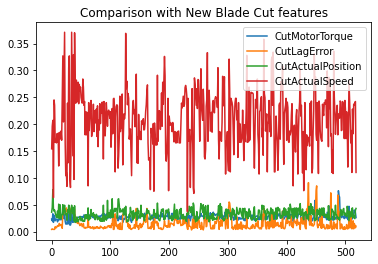

In [18]:
cols = compare_new_cut.columns[3:7]
for col in cols:
    plt.plot(compare_new_cut[col])
plt.legend(cols)
plt.title('Comparison with New Blade Cut features')
plt.show()

<b>Performing PCA and then comparing</b>

In [20]:
pca = PCA(n_components = 4)
principalComponents = pca.fit_transform(new_blade_cut)
new_blade_cut_pca = pd.DataFrame(data = principalComponents, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])

In [21]:
new_blade_cut_pca

,PCA1,PCA2,PCA3,PCA4
0,-0.433429,0.008455,0.069807,0.023135
1,-0.432982,0.009084,0.060887,0.022166
2,-0.433904,0.007514,0.072609,0.018964
3,-0.434679,0.005862,0.072543,0.017276
4,-0.433153,0.009279,0.078419,0.017354
...,...,...,...,...
2043,0.308864,-0.630657,-0.024927,0.019332
2044,0.308326,-0.630414,-0.019431,0.015864
2045,0.312286,-0.619831,0.017420,-0.010817
2046,0.313198,-0.617022,0.017608,-0.014569


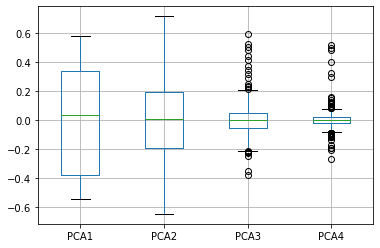

In [22]:
boxplot = new_blade_cut_pca.boxplot(column=['PCA1', 'PCA2', 'PCA3', 'PCA4'])

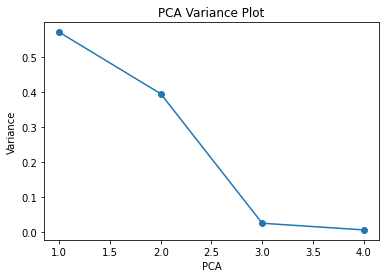

In [21]:
# visualising variance of each pca
vals = [1, 2, 3, 4]
plt.plot(vals, pca.explained_variance_ratio_, 'o-')
plt.xlabel('PCA')
plt.ylabel('Variance')
plt.title('PCA Variance Plot')
plt.show()

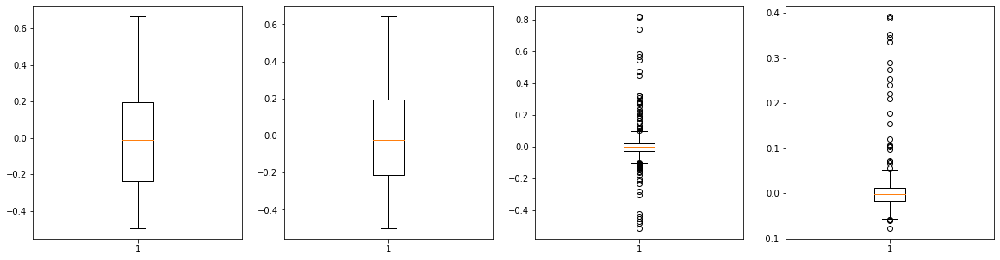

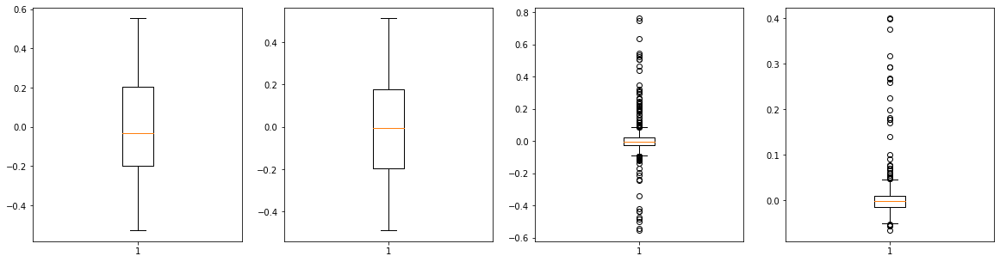

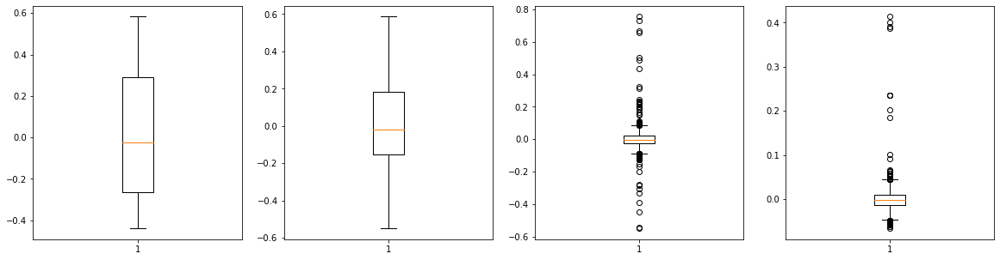

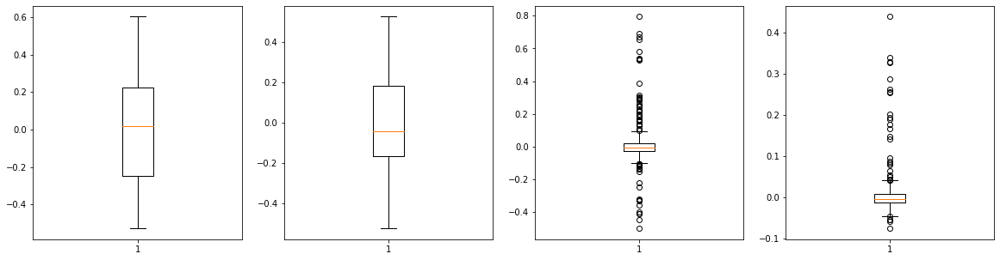

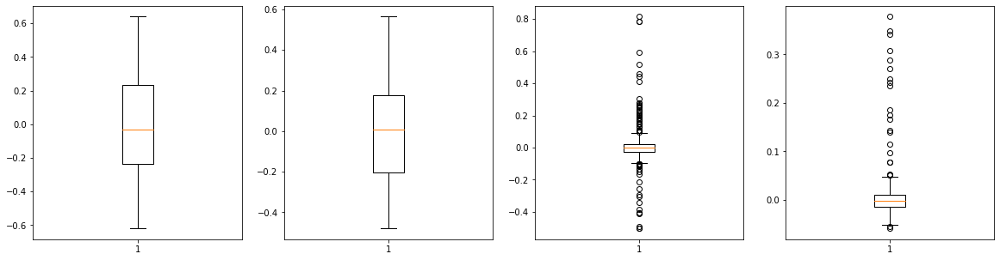

...

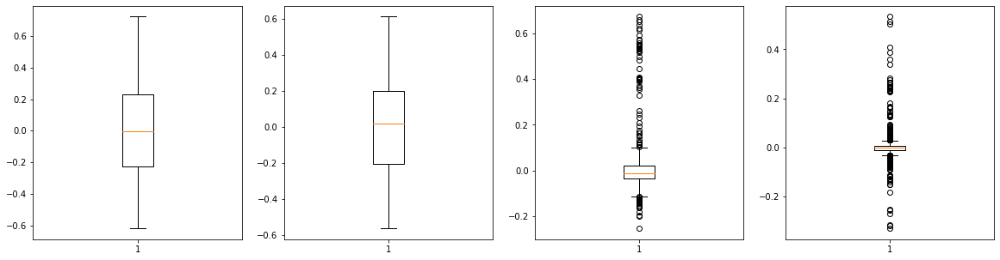

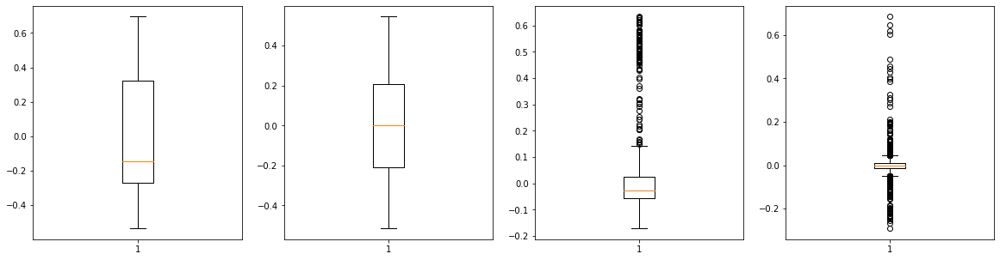

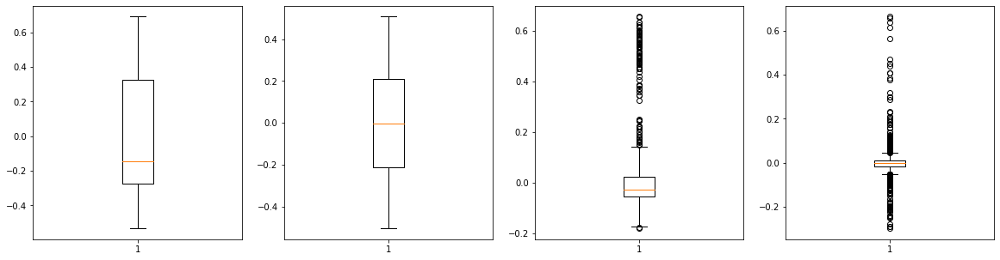

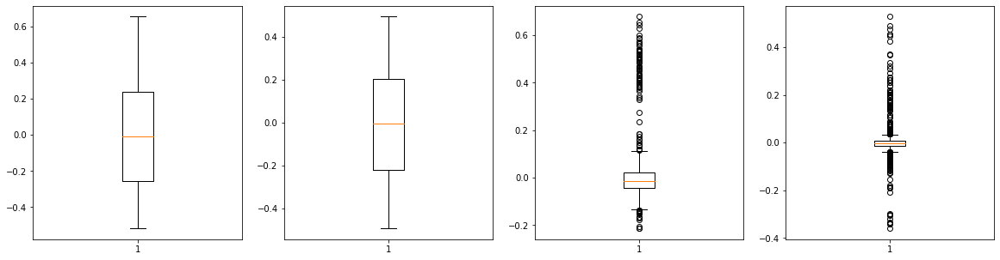

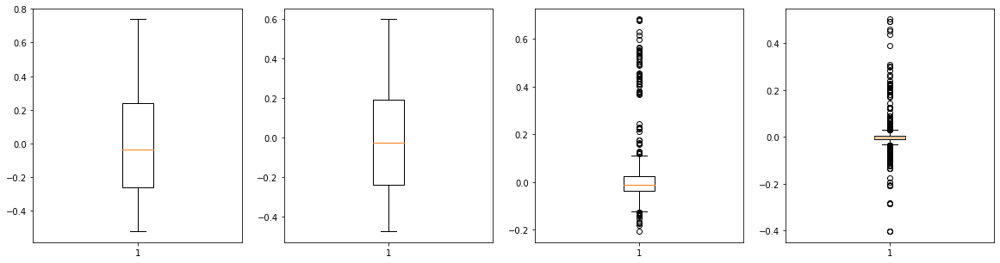

In [35]:
# since PCA1 and PCA2 hava significant values, lets perform further analysis using the same
for file in files:
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)
    
    principal_components = pca.fit_transform(df)
    df_pca = pd.DataFrame(data = principal_components, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])
    
    axes[0].boxplot(df_pca['PCA1'])
    axes[1].boxplot(df_pca['PCA2'])
    axes[2].boxplot(df_pca['PCA3'])
    axes[3].boxplot(df_pca['PCA4'])
    plt.show()


In [59]:
compare_new_cut_pca = pd.DataFrame(columns = ['File', 'Mode', 'Month', 'PCA1', 'PCA2', 'PCA3', 'PCA4'])
compare_new_cut_pca

,File,Mode,Month,PCA1,PCA2,PCA3,PCA4


In [61]:
# since PCA1 and PCA2 hava significant values, lets perform further analysis using the same
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)
    
    principal_components = pca.fit_transform(df)
    df_pca = pd.DataFrame(data = principal_components, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])
    
    s = str(file)
    month = s[18:20]
    mode = s[39]
    fileno = s[31:34]
    
    mse_values = []
    for i in range(4):
        val = mean_squared_error(df_pca.iloc[:,i], new_blade_cut_pca.iloc[:,i])
        mse_values.append(val)
    compare_new_cut_pca = compare_new_cut_pca.append({'File':fileno, 'Mode':mode, 'Month':month, 
                                              'PCA1':mse_values[0], 'PCA2':mse_values[1], 
                                               'PCA3':mse_values[2], 'PCA4':mse_values[3]}, ignore_index=True)

In [62]:
compare_new_cut_pca

,File,Mode,Month,PCA1,PCA2,PCA3,PCA4
0,000,1,01,0.360250,0.105670,0.011053,0.002740
1,001,1,01,0.248369,0.066595,0.010488,0.002482
2,002,1,01,0.403996,0.192658,0.009754,0.002455
3,003,1,01,0.102388,0.095700,0.010120,0.002456
4,004,1,01,0.305439,0.158154,0.009702,0.002395
...,...,...,...,...,...,...,...
514,514,1,12,0.129386,0.165067,0.014025,0.003606
515,515,2,12,0.314139,0.201817,0.018511,0.004928
516,516,2,12,0.311810,0.113113,0.017485,0.004917
517,517,2,12,0.255987,0.180589,0.014476,0.004424


In [74]:
compare_new_cut_pca.to_csv('Compare with new.csv')

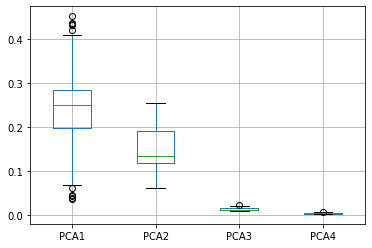

In [63]:
boxplot = compare_new_cut_pca.boxplot(column=['PCA1', 'PCA2', 'PCA3', 'PCA4'])

In [25]:
# visulaising pca month wise with new blade
month1 = compare_new_cut_pca[compare_new_cut_pca['Month']=='01']
month2 = compare_new_cut_pca[compare_new_cut_pca['Month']=='02']
month3 = compare_new_cut_pca[compare_new_cut_pca['Month']=='03']
month4 = compare_new_cut_pca[compare_new_cut_pca['Month']=='04']
month5 = compare_new_cut_pca[compare_new_cut_pca['Month']=='05']
month6 = compare_new_cut_pca[compare_new_cut_pca['Month']=='06']
month7 = compare_new_cut_pca[compare_new_cut_pca['Month']=='07']
month8 = compare_new_cut_pca[compare_new_cut_pca['Month']=='08']
month9 = compare_new_cut_pca[compare_new_cut_pca['Month']=='09']
month10 = compare_new_cut_pca[compare_new_cut_pca['Month']=='10']
month11 = compare_new_cut_pca[compare_new_cut_pca['Month']=='11']
month12 = compare_new_cut_pca[compare_new_cut_pca['Month']=='12']
month_data = [month1, month2, month3, month4, month5, month6, month7, month8, month9, month10, month11, month12]

c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

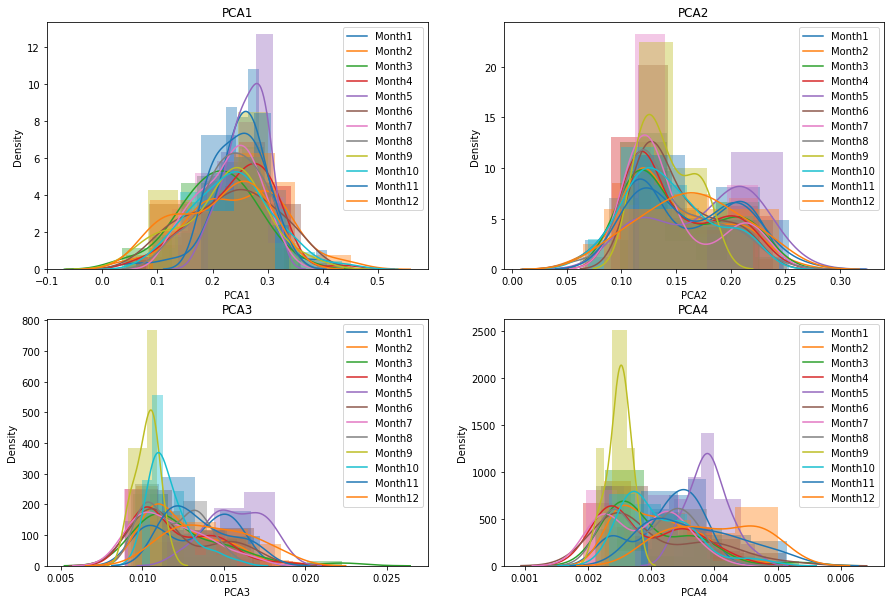

In [26]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for month in month_data:
    sns.distplot(month['PCA1'], ax=axes[0][0])
    sns.distplot(month['PCA2'], ax=axes[0][1])
    sns.distplot(month['PCA3'], ax=axes[1][0])
    sns.distplot(month['PCA4'], ax=axes[1][1])
    
axes[0][0].title.set_text('PCA1')
axes[0][1].title.set_text('PCA2')
axes[1][0].title.set_text('PCA3')
axes[1][1].title.set_text('PCA4')

axes[0][0].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
axes[0][1].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
axes[1][0].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
axes[1][1].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
plt.show()

In [27]:
# for PCA1 and PCA2
kurtosis1 = []
kurtosis2 = []
skewness1 = []
skewness2 = []
sd1 = []
sd2 = []
variance1 = []
variance2 = []

for month in month_data:
    kurtosis1.append(kurtosis(np.array(month['PCA1'])))
    kurtosis2.append(kurtosis(np.array(month['PCA2'])))
    skewness1.append(skew(np.array(month['PCA1'])))
    skewness2.append(skew(np.array(month['PCA2'])))
    sd1.append(statistics.stdev(np.array(month['PCA1'])))
    sd2.append(statistics.stdev(np.array(month['PCA2'])))
    variance1.append(statistics.variance(np.array(month['PCA1'])))
    variance2.append(statistics.variance(np.array(month['PCA2'])))

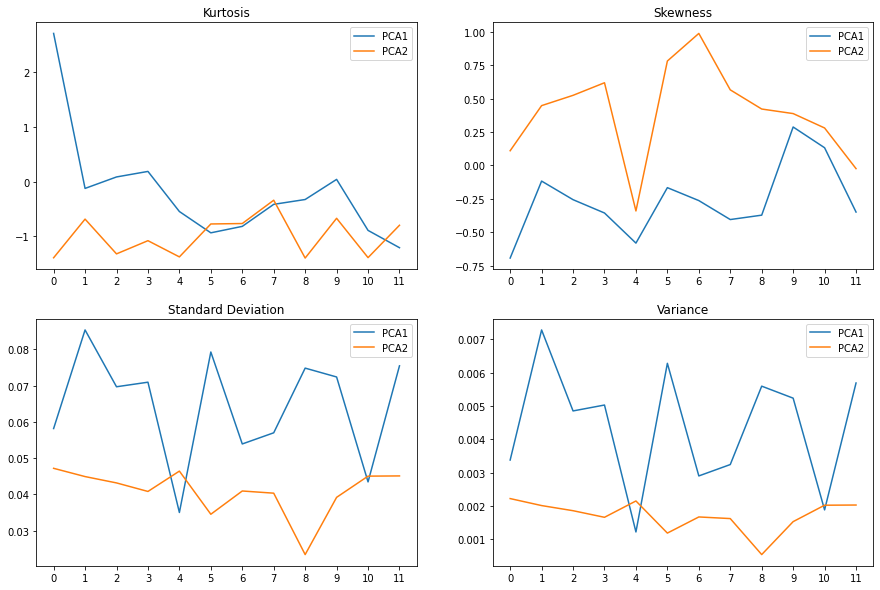

In [28]:
# visulaising descriptive stats
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
x = [0,1,2,3,4,5,6,7,8,9,10,11]

# 1. kurtosis
axes[0][0].plot(kurtosis1)
axes[0][0].plot(kurtosis2)
axes[0][0].legend(['PCA1', 'PCA2'])
axes[0][0].title.set_text('Kurtosis')
axes[0][0].set_xticks(x) 

# 2. skewness
axes[0][1].plot(skewness1)
axes[0][1].plot(skewness2)
axes[0][1].legend(['PCA1', 'PCA2'])
axes[0][1].title.set_text('Skewness')
axes[0][1].set_xticks(x) 

# 3. sd
axes[1][0].plot(sd1)
axes[1][0].plot(sd2)
axes[1][0].legend(['PCA1', 'PCA2'])
axes[1][0].title.set_text('Standard Deviation')
axes[1][0].set_xticks(x) 

# 4. variance
axes[1][1].plot(variance1)
axes[1][1].plot(variance2)
axes[1][1].legend(['PCA1', 'PCA2'])
axes[1][1].title.set_text('Variance')
axes[1][1].set_xticks(x) 

plt.show()

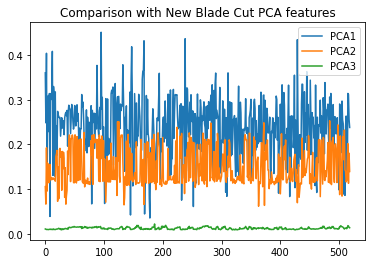

In [34]:
cols = compare_new_cut_pca.columns[3:6]
for col in cols:
    plt.plot(compare_new_cut_pca[col])
plt.legend(cols)
plt.title('Comparison with New Blade Cut PCA features')
plt.show()

c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

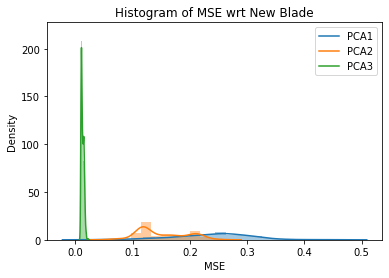

In [35]:
sns.distplot(compare_new_cut_pca['PCA1'])
sns.distplot(compare_new_cut_pca['PCA2'])
sns.distplot(compare_new_cut_pca['PCA3'])

plt.title('Histogram of MSE wrt New Blade')
plt.xlabel('MSE')
plt.legend(['PCA1', 'PCA2', 'PCA3'])
plt.show()

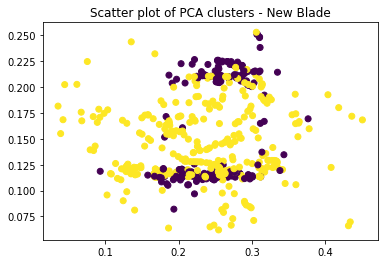

In [36]:
gmm = GaussianMixture(n_components=2, init_params='random', random_state=0)
gmm.fit(compare_new_cut_pca)
cluster = gmm.predict(compare_new_cut_pca)
plt.scatter(compare_new_cut_pca.iloc[:,3], compare_new_cut_pca.iloc[:,4], c=cluster)
plt.title('Scatter plot of PCA clusters - New Blade')
plt.show()

In [37]:
compare_new_cut_pca.to_csv('New Balde Comparison.csv')

# Comparison with worn blade

In [4]:
worn_blade = pd.read_csv('./Blade New/Data/WornBlade001.csv')

In [5]:
scaler = MinMaxScaler() 
scaled = scaler.fit_transform(worn_blade)
worn_blade = pd.DataFrame(scaled, columns = worn_blade.columns)

In [6]:
worn_blade.head()

,Timestamp,pCut Motor: Torque,pCut CTRL Position controller: Lag error,pCut CTRL Position controller: Actual position,pCut CTRL Position controller: Actual speed,pSvolFilm CTRL Position controller: Actual position,pSvolFilm CTRL Position controller: Actual speed,pSvolFilm CTRL Position controller: Lag error
0,0.000000,0.822794,0.606402,0.000000,0.210926,0.0,0.004554,0.003230
1,0.000489,0.827376,0.602753,0.000000,0.212443,0.0,0.002732,0.002153
2,0.000977,0.829909,0.599105,0.000117,0.213961,0.0,0.003643,0.003230
3,0.001466,0.827951,0.599105,0.000117,0.209408,0.0,0.001822,0.002153
4,0.001954,0.823911,0.602753,0.000000,0.209408,0.0,0.000911,0.003230


In [7]:
worn_blade.rename(columns={"Timestamp":"Time Elapsed",
                         "pCut Motor: Torque":"CutMotorTorque",
                         " pCut CTRL Position controller: Lag error": "CutLagError",
                         " pCut CTRL Position controller: Actual position" :"CutActualPosition",
                         " pCut CTRL Position controller: Actual speed":"CutActualSpeed",
                         " pSvolFilm CTRL Position controller: Actual position":"FilmActualPosition",
                         " pSvolFilm CTRL Position controller: Actual speed":"FilmActualSpeed",
                         " pSvolFilm CTRL Position controller: Lag error":"FilmLagError"},
                inplace=True)

In [8]:
worn_blade.head()

,Time Elapsed,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed,FilmActualPosition,FilmActualSpeed,FilmLagError
0,0.000000,0.822794,0.606402,0.000000,0.210926,0.0,0.004554,0.003230
1,0.000489,0.827376,0.602753,0.000000,0.212443,0.0,0.002732,0.002153
2,0.000977,0.829909,0.599105,0.000117,0.213961,0.0,0.003643,0.003230
3,0.001466,0.827951,0.599105,0.000117,0.209408,0.0,0.001822,0.002153
4,0.001954,0.823911,0.602753,0.000000,0.209408,0.0,0.000911,0.003230


In [54]:
matrix = worn_blade.corr()
print(matrix)

                    Time Elapsed  CutMotorTorque  CutLagError  \
Time Elapsed            1.000000        0.110818     0.000951   
CutMotorTorque          0.110818        1.000000    -0.111604   
CutLagError             0.000951       -0.111604     1.000000   
CutActualPosition       0.975156        0.074445     0.001711   
CutActualSpeed          0.003075       -0.764054    -0.009008   
FilmActualPosition      0.998249        0.072761     0.000561   
FilmActualSpeed         0.301646        0.090059    -0.004796   
FilmLagError            0.098789        0.142951     0.141598   

                    CutActualPosition  CutActualSpeed  FilmActualPosition  \
Time Elapsed                 0.975156        0.003075            0.998249   
CutMotorTorque               0.074445       -0.764054            0.072761   
CutLagError                  0.001711       -0.009008            0.000561   
CutActualPosition            1.000000        0.002620            0.976366   
CutActualSpeed               

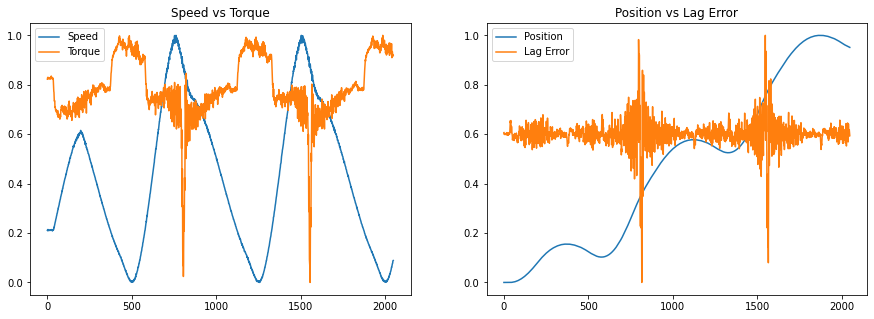

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(worn_blade['CutActualSpeed'])
axes[0].plot(worn_blade['CutMotorTorque'])
axes[0].legend(['Speed', 'Torque'])
axes[0].title.set_text('Speed vs Torque')

axes[1].plot(worn_blade['CutActualPosition'])
axes[1].plot(worn_blade['CutLagError'])
axes[1].legend(['Position', 'Lag Error'])
axes[1].title.set_text('Position vs Lag Error')

plt.show()

<b>Comparing with cut features</b>

In [13]:
compare_worn_cut = pd.DataFrame(columns = ['File', 'Mode', 'Month', 'CutMotorTorque', 'CutLagError','CutActualPosition', 'CutActualSpeed'])
compare_worn_cut

,File,Mode,Month,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed


In [34]:
worn_blade_cut = worn_blade.iloc[:, 1:5]

In [56]:
matrix = worn_blade_cut.corr()
print(matrix)

                   CutMotorTorque  CutLagError  CutActualPosition  \
CutMotorTorque           1.000000    -0.111604           0.074445   
CutLagError             -0.111604     1.000000           0.001711   
CutActualPosition        0.074445     0.001711           1.000000   
CutActualSpeed          -0.764054    -0.009008           0.002620   

                   CutActualSpeed  
CutMotorTorque          -0.764054  
CutLagError             -0.009008  
CutActualPosition        0.002620  
CutActualSpeed           1.000000  


<AxesSubplot:>

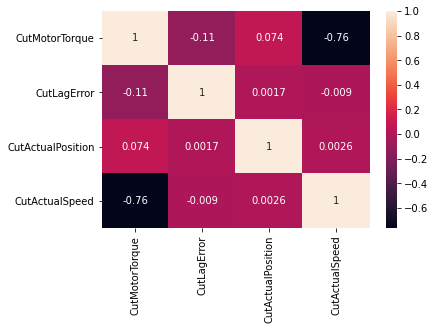

In [57]:
sns.heatmap(matrix, annot=True)

In [35]:
worn_blade_cut.head()

,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed
0,0.822794,0.606402,0.000000,0.210926
1,0.827376,0.602753,0.000000,0.212443
2,0.829909,0.599105,0.000117,0.213961
3,0.827951,0.599105,0.000117,0.209408
4,0.823911,0.602753,0.000000,0.209408


In [16]:
features = worn_blade_cut.columns

In [17]:
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)

    s = str(file)
    month = s[18:20]
    mode = s[39]
    fileno = s[31:34]
    
    r2_values = []
    for feature in features:
        #val = r2_score(df[feature], worn_blade_cut[feature])
        val = mean_squared_error(df[feature], worn_blade_cut[feature])
        r2_values.append(val)  
    compare_worn_cut = compare_worn_cut.append({'File':fileno, 'Mode':mode, 'Month':month, 
                                              'CutMotorTorque':round(r2_values[0], 3), 
                                               'CutLagError':round(r2_values[1], 3), 
                                              'CutActualPosition':round(r2_values[2], 3),
                                              'CutActualSpeed':round(r2_values[3], 3)}, ignore_index=True)

In [48]:
compare_worn_cut

,File,Mode,Month,CutMotorTorque,CutLagError,CutActualPosition,CutActualSpeed
0,000,1,01,0.022,0.005,0.023,0.176
1,001,1,01,0.022,0.006,0.030,0.204
2,002,1,01,0.029,0.005,0.052,0.207
3,003,1,01,0.015,0.005,0.020,0.049
4,004,1,01,0.030,0.005,0.031,0.267
...,...,...,...,...,...,...,...
514,514,1,12,0.032,0.006,0.025,0.239
515,515,2,12,0.039,0.015,0.016,0.234
516,516,2,12,0.041,0.013,0.016,0.246
517,517,2,12,0.033,0.008,0.025,0.221


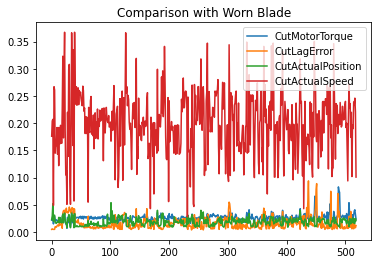

In [49]:
cols = compare_worn_cut.columns[3:7]
for col in cols:
    plt.plot(compare_worn_cut[col])
plt.legend(cols)
plt.title('Comparison with Worn Blade')
plt.show()

<b>Performing PCA and then comparing</b>

In [18]:
pca = PCA(n_components = 4)
principalComponents = pca.fit_transform(worn_blade_cut)
worn_blade_cut_pca = pd.DataFrame(data = principalComponents, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])

In [19]:
worn_blade_cut_pca

,PCA1,PCA2,PCA3,PCA4
0,-0.462619,-0.244441,0.025359,0.000267
1,-0.462474,-0.244539,0.019768,0.002573
2,-0.462305,-0.243950,0.016047,0.005370
3,-0.462202,-0.247586,0.019303,0.006219
4,-0.462504,-0.246246,0.023907,0.003655
...,...,...,...,...
2043,0.498203,-0.351903,0.003640,-0.006077
2044,0.497539,-0.346375,0.010679,-0.016094
2045,0.496843,-0.339574,0.007105,-0.006976
2046,0.496773,-0.340310,0.000474,0.001351


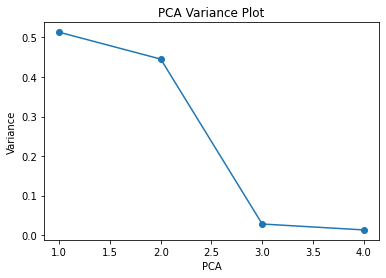

In [20]:
# visualising variance of each pca
vals = [1, 2, 3, 4]
plt.plot(vals, pca.explained_variance_ratio_, 'o-')
plt.xlabel('PCA')
plt.ylabel('Variance')
plt.title('PCA Variance Plot')
plt.show()

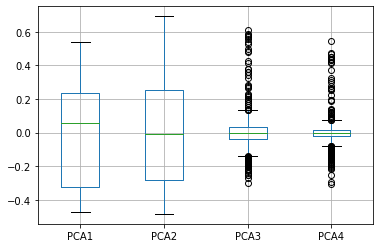

In [21]:
boxplot = worn_blade_cut_pca.boxplot(column=['PCA1', 'PCA2', 'PCA3', 'PCA4'])

In [64]:
compare_worn_cut_pca = pd.DataFrame(columns = ['File', 'Mode', 'Month', 'PCA1', 'PCA2', 'PCA3', 'PCA4'])
compare_worn_cut_pca

,File,Mode,Month,PCA1,PCA2,PCA3,PCA4


In [66]:
# since PCA1 and PCA2 hava significant values, lets perform further analysis using the same
for file in files:
    
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)
    
    principal_components = pca.fit_transform(df)
    df_pca = pd.DataFrame(data = principal_components, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])
    
    s = str(file)
    month = s[18:20]
    mode = s[39]
    fileno = s[31:34]
    
    mse_values = []
    for i in range(4):
        val = mean_squared_error(df_pca.iloc[:,i], worn_blade_cut_pca.iloc[:,i])
        mse_values.append(val)
    compare_worn_cut_pca = compare_worn_cut_pca.append({'File':fileno, 'Mode':mode, 'Month':month, 
                                              'PCA1':mse_values[0], 'PCA2':mse_values[1], 
                                               'PCA3':mse_values[2], 'PCA4':mse_values[3]}, ignore_index=True)

In [67]:
compare_worn_cut_pca

,File,Mode,Month,PCA1,PCA2,PCA3,PCA4
0,000,1,01,0.353960,0.149565,0.010612,0.003879
1,001,1,01,0.235033,0.118350,0.010109,0.003771
2,002,1,01,0.354751,0.213828,0.009362,0.003611
3,003,1,01,0.049418,0.066044,0.010779,0.003719
4,004,1,01,0.320765,0.220413,0.009921,0.003605
...,...,...,...,...,...,...,...
514,514,1,12,0.089192,0.230055,0.012629,0.004644
515,515,2,12,0.305729,0.159885,0.018017,0.005836
516,516,2,12,0.303943,0.168730,0.020863,0.006415
517,517,2,12,0.217607,0.128193,0.014300,0.005507


In [73]:
compare_worn_cut_pca.to_csv('Compare with worn.csv')

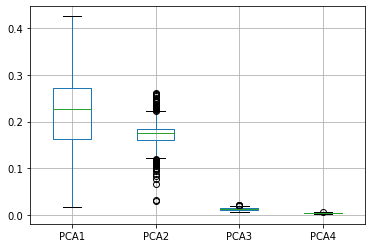

In [68]:
boxplot = compare_worn_cut_pca.boxplot(column=['PCA1', 'PCA2', 'PCA3', 'PCA4'])

In [69]:
# visulaising pca month wise with new blade
month1 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='01']
month2 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='02']
month3 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='03']
month4 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='04']
month5 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='05']
month6 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='06']
month7 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='07']
month8 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='08']
month9 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='09']
month10 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='10']
month11 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='11']
month12 = compare_worn_cut_pca[compare_worn_cut_pca['Month']=='12']
month_data = [month1, month2, month3, month4, month5, month6, month7, month8, month9, month10, month11, month12]

c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

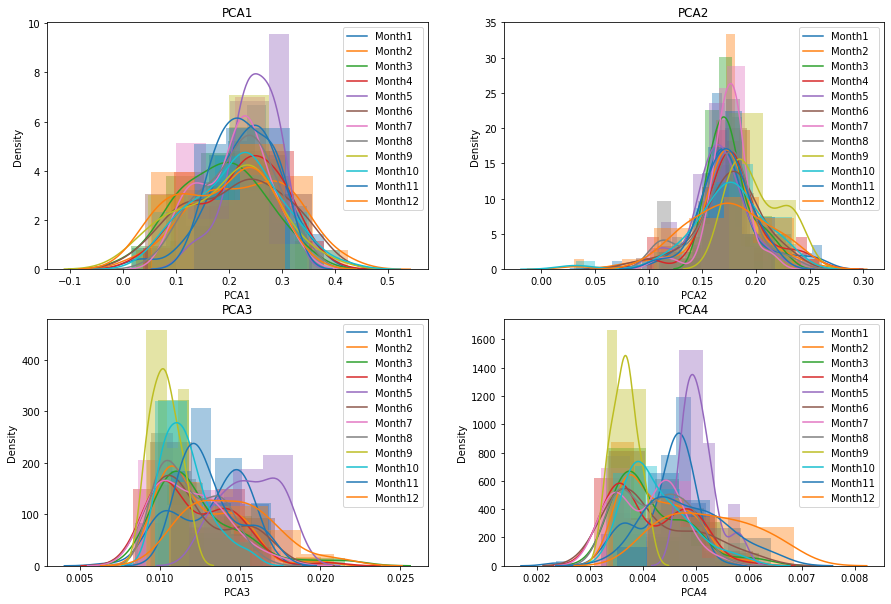

In [70]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for month in month_data:
    sns.distplot(month['PCA1'], ax=axes[0][0])
    sns.distplot(month['PCA2'], ax=axes[0][1])
    sns.distplot(month['PCA3'], ax=axes[1][0])
    sns.distplot(month['PCA4'], ax=axes[1][1])
    
axes[0][0].title.set_text('PCA1')
axes[0][1].title.set_text('PCA2')
axes[1][0].title.set_text('PCA3')
axes[1][1].title.set_text('PCA4')

axes[0][0].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
axes[0][1].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
axes[1][0].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
axes[1][1].legend(['Month1', 'Month2', 'Month3', 'Month4', 'Month5', 'Month6', 'Month7', 'Month8', 'Month9', 'Month10', 'Month11', 'Month12'])
plt.show()

In [71]:
# for PCA1 and PCA2
kurtosis1 = []
kurtosis2 = []
skewness1 = []
skewness2 = []
sd1 = []
sd2 = []
variance1 = []
variance2 = []

for month in month_data:
    kurtosis1.append(kurtosis(np.array(month['PCA1'])))
    kurtosis2.append(kurtosis(np.array(month['PCA2'])))
    skewness1.append(skew(np.array(month['PCA1'])))
    skewness2.append(skew(np.array(month['PCA2'])))
    sd1.append(statistics.stdev(np.array(month['PCA1'])))
    sd2.append(statistics.stdev(np.array(month['PCA2'])))
    variance1.append(statistics.variance(np.array(month['PCA1'])))
    variance2.append(statistics.variance(np.array(month['PCA2'])))

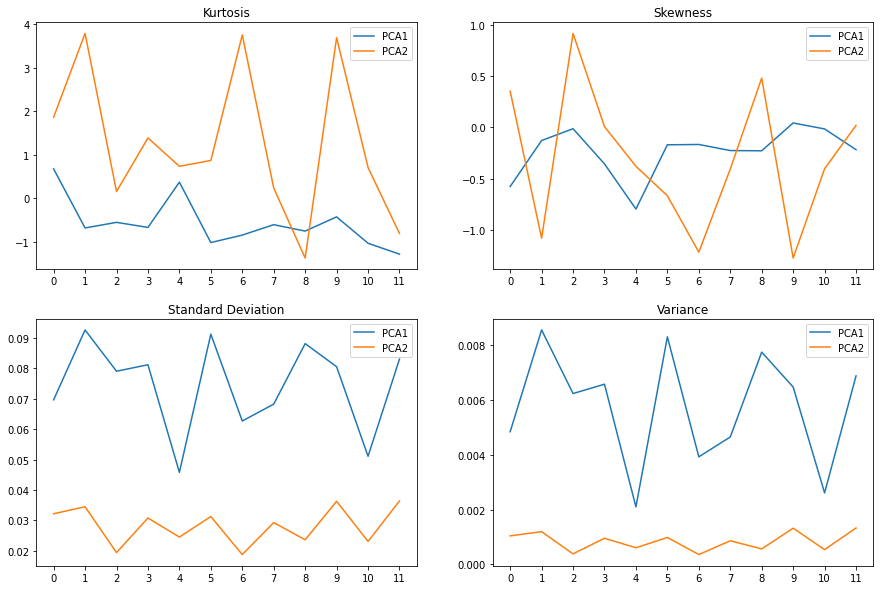

In [72]:
# visulaising descriptive stats
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
x = [0,1,2,3,4,5,6,7,8,9,10,11]

# 1. kurtosis
axes[0][0].plot(kurtosis1)
axes[0][0].plot(kurtosis2)
axes[0][0].legend(['PCA1', 'PCA2'])
axes[0][0].title.set_text('Kurtosis')
axes[0][0].set_xticks(x) 

# 2. skewness
axes[0][1].plot(skewness1)
axes[0][1].plot(skewness2)
axes[0][1].legend(['PCA1', 'PCA2'])
axes[0][1].title.set_text('Skewness')
axes[0][1].set_xticks(x) 

# 3. sd
axes[1][0].plot(sd1)
axes[1][0].plot(sd2)
axes[1][0].legend(['PCA1', 'PCA2'])
axes[1][0].title.set_text('Standard Deviation')
axes[1][0].set_xticks(x) 

# 4. variance
axes[1][1].plot(variance1)
axes[1][1].plot(variance2)
axes[1][1].legend(['PCA1', 'PCA2'])
axes[1][1].title.set_text('Variance')
axes[1][1].set_xticks(x) 

plt.show()

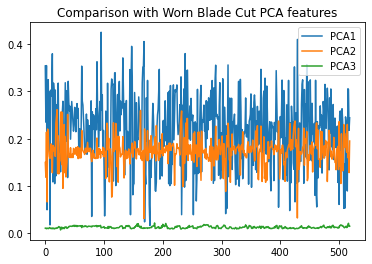

In [44]:
cols = compare_worn_cut_pca.columns[3:6]
for col in cols:
    plt.plot(compare_worn_cut_pca[col])
plt.legend(cols)
plt.title('Comparison with Worn Blade Cut PCA features')
plt.show()

c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

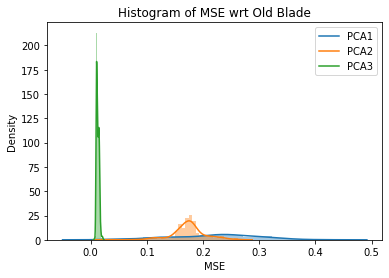

In [45]:
sns.distplot(compare_worn_cut_pca['PCA1'])
sns.distplot(compare_worn_cut_pca['PCA2'])
sns.distplot(compare_worn_cut_pca['PCA3'])

plt.title('Histogram of MSE wrt Old Blade')
plt.xlabel('MSE')
plt.legend(['PCA1', 'PCA2', 'PCA3'])
plt.show()

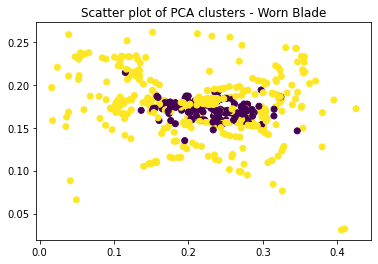

In [58]:
gmm = GaussianMixture(n_components=2, init_params='random', random_state=0)
gmm.fit(compare_worn_cut_pca)
cluster = gmm.predict(compare_worn_cut_pca)
plt.scatter(compare_worn_cut_pca.iloc[:,3], compare_worn_cut_pca.iloc[:,4], c=cluster)
plt.title('Scatter plot of PCA clusters - Worn Blade')
plt.show()

In [46]:
compare_worn_cut_pca.to_csv('Worn Balde Comparison.csv')

# Comparing with new and worn blade

In [37]:
pca = PCA(n_components = 4)

principalComponents = pca.fit_transform(new_blade_cut)
new_blade_cut_pca = pd.DataFrame(data = principalComponents, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])

principalComponents = pca.fit_transform(worn_blade_cut)
worn_blade_cut_pca = pd.DataFrame(data = principalComponents, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])

In [38]:
file_pca = []
for file in files:
       
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    df = df.iloc[:, 1:5]
    scaler = MinMaxScaler() 
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled, columns = df.columns)
    
    principal_components = pca.fit_transform(df)
    df_pca = pd.DataFrame(data = principal_components, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])
    file_pca.append(df_pca)

In [39]:
file_pca[1]

,PCA1,PCA2,PCA3,PCA4
0,0.522068,0.433642,0.002073,-0.005194
1,0.512309,0.435692,0.018453,-0.013256
2,0.505511,0.438272,0.057953,-0.003656
3,0.499134,0.439991,0.068332,-0.003728
4,0.496360,0.440711,0.036699,0.008092
...,...,...,...,...
2043,0.086293,-0.489526,0.023483,0.020224
2044,0.088450,-0.489780,0.023282,0.018045
2045,0.089744,-0.489782,0.027828,0.017068
2046,0.090776,-0.489938,0.028053,0.015901


In [40]:
# visualising PCA1 features as box plot to comapare each file with new and worn blade
boxplot_data = []
i = 1
for df in file_pca:
    x1 = pd.DataFrame(new_blade_cut_pca['PCA1'])
    x1.columns = ['New']
    x2 = pd.DataFrame(df['PCA1'])
    x2.columns = ['File']
    x3 = pd.DataFrame(worn_blade_cut_pca['PCA1'])
    x3.columns = ['Worn']
    temp = pd.concat([x1, x2, x3], axis=1)
    temp = temp.assign(Location=i)
    boxplot_data.append(temp)
    i += 1

In [148]:
cdf = pd.concat([x for x in boxplot_data])

In [149]:
cdf

,New,File,Worn,Location
0,-0.433429,0.383758,-0.462619,1
1,-0.432982,0.386456,-0.462474,1
2,-0.433904,0.388749,-0.462305,1
3,-0.434679,0.394367,-0.462202,1
4,-0.433153,0.395487,-0.462504,1
...,...,...,...,...
2043,0.308864,0.371446,0.498203,519
2044,0.308326,0.374084,0.497539,519
2045,0.312286,0.377204,0.496843,519
2046,0.313198,0.384112,0.496773,519


In [150]:
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['PCA1'])

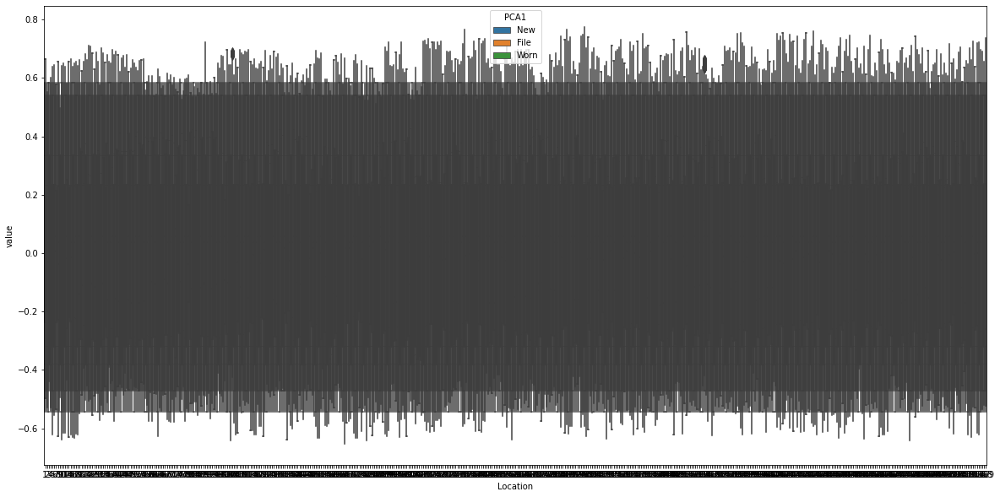

In [151]:
plt.figure(figsize=(20,10))
ax = sns.boxplot(x="Location", y="value", hue='PCA1', data=mdf, width=0.5)    
plt.show()

In [153]:
boxplot_data = [boxplot_data[i:i+20] for i in range(0, len(boxplot_data), 20)]

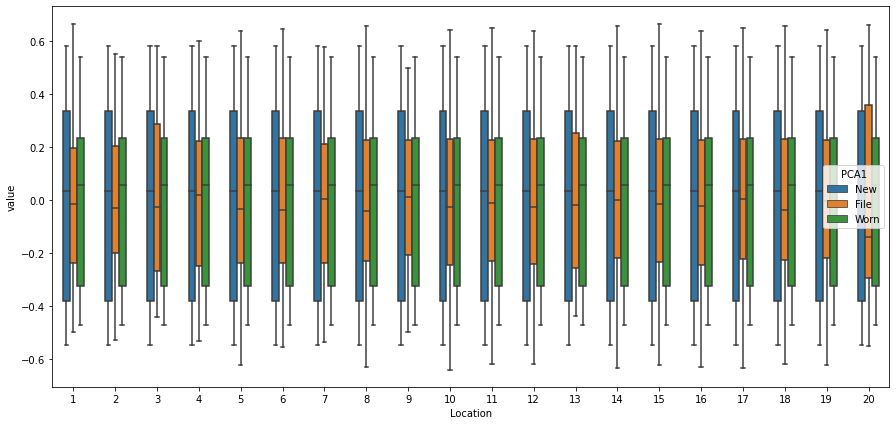

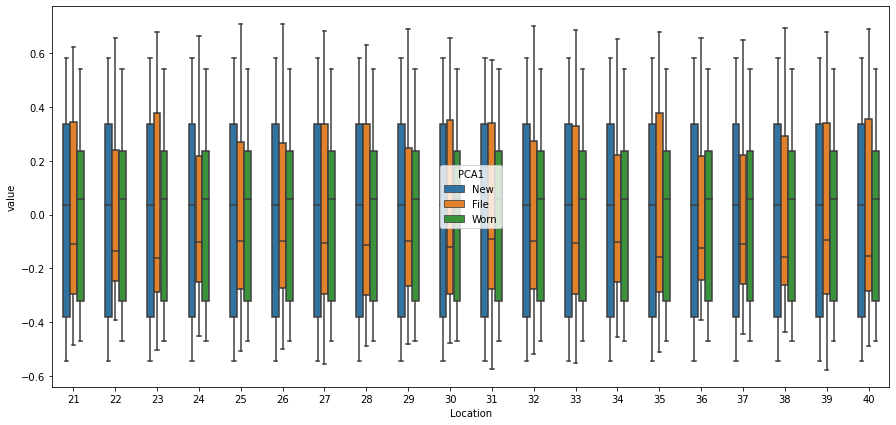

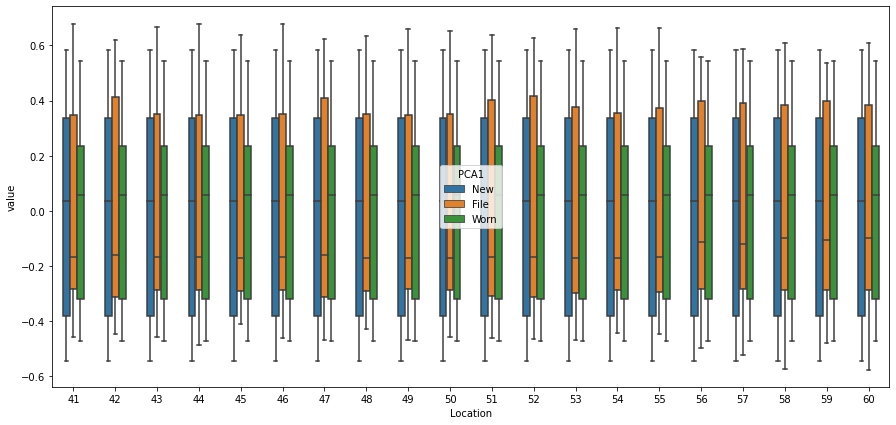

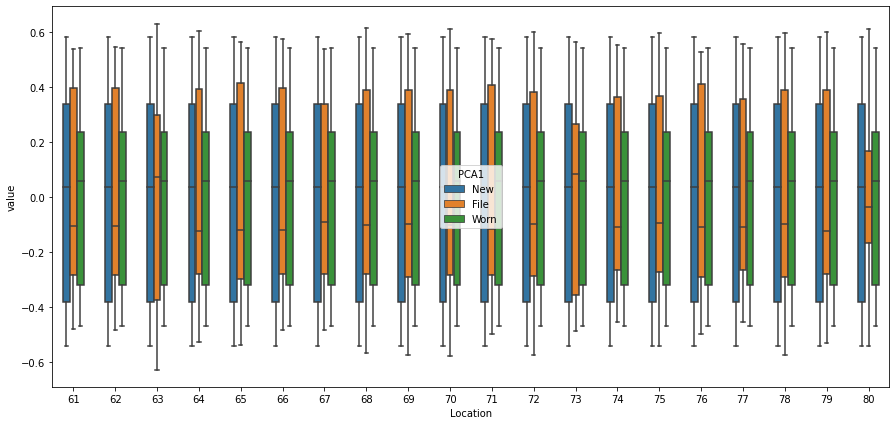

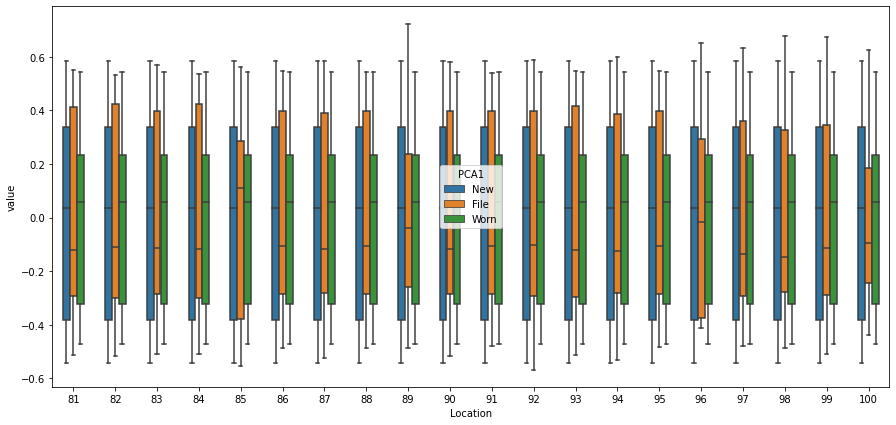

...

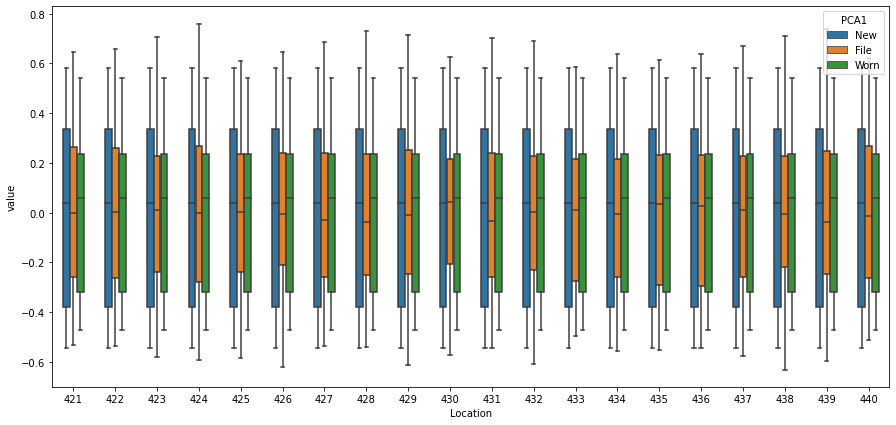

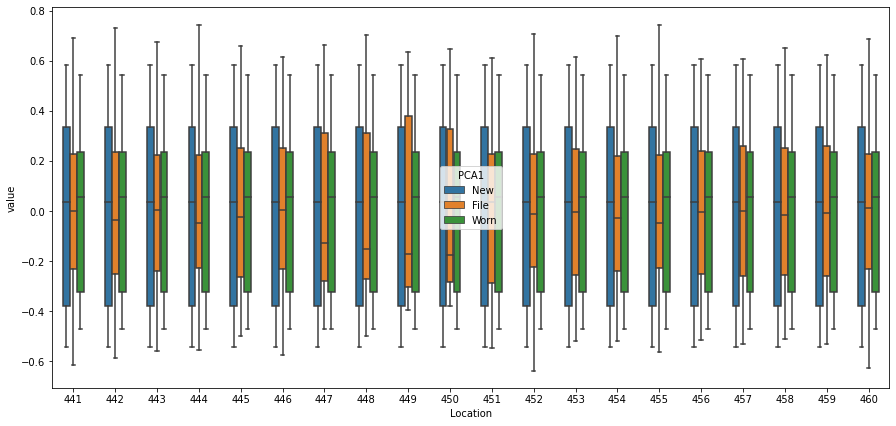

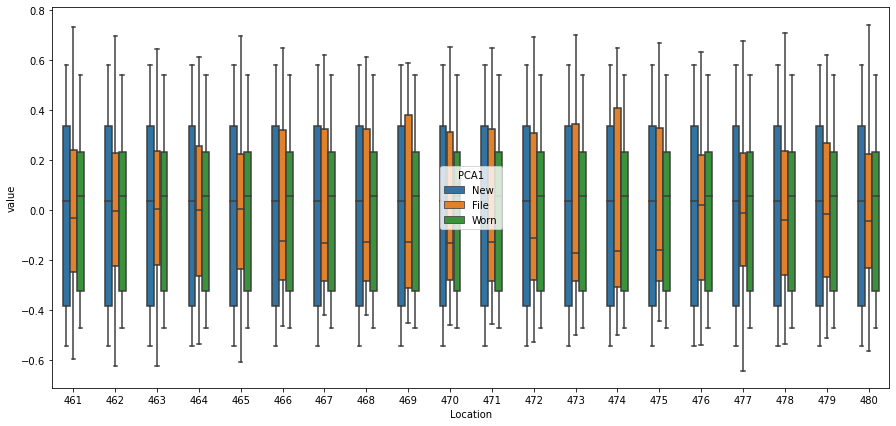

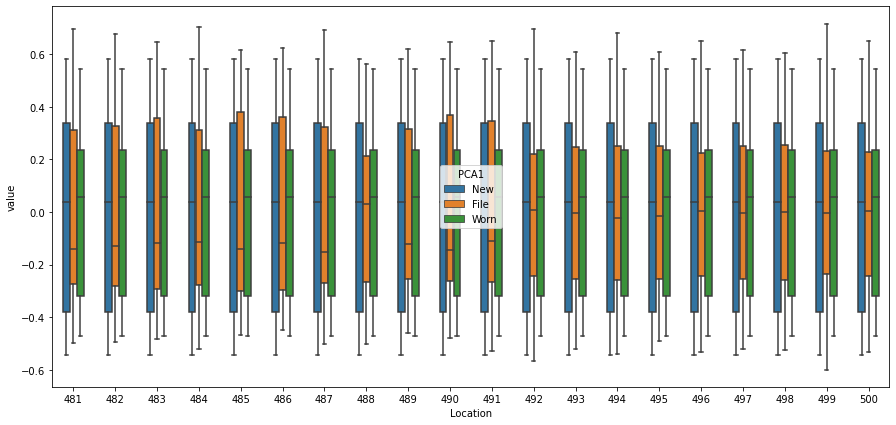

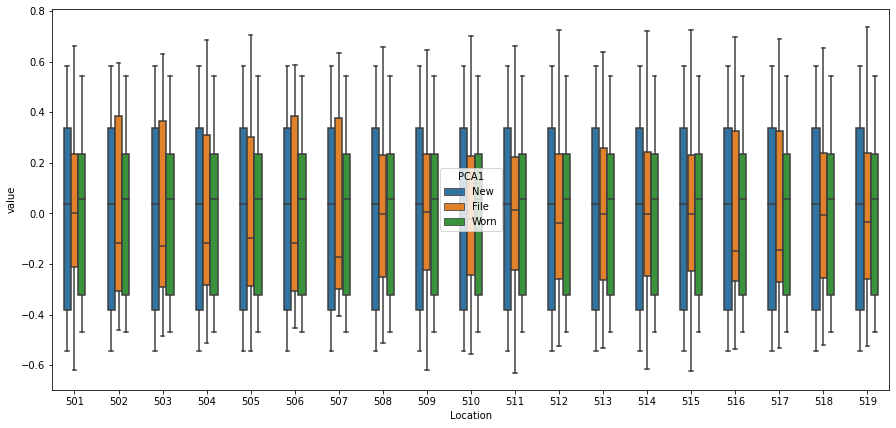

In [158]:
for data in boxplot_data:
    cdf = pd.concat([x for x in data])
    mdf = pd.melt(cdf, id_vars=['Location'], var_name=['PCA1'])
    plt.figure(figsize=(15,7))
    ax = sns.boxplot(x="Location", y="value", hue='PCA1', data=mdf, width=0.5) 
    plt.show()

In [46]:
new_pca1 = np.array(new_blade_cut_pca['PCA1'])
new_q1 = np.quantile(new_pca1, .25)
new_q2 = np.quantile(new_pca1, .50)
new_q3 = np.quantile(new_pca1, .75)
new_iqr = new_q3 - new_q1

worn_pca1 = np.array(worn_blade_cut_pca['PCA1'])
worn_q1 = np.quantile(worn_pca1, .25)
worn_q2 = np.quantile(worn_pca1, .50)
worn_q3 = np.quantile(worn_pca1, .75)
worn_iqr = worn_q3 - worn_q1

In [47]:
q1 = []
q2 = []
q3 = []
iqr = []

for df in file_pca:
    a = np.array(df['PCA1'])
    a_q1 = np.quantile(a, .25)
    a_q2 = np.quantile(a, .5)
    a_q3 = np.quantile(a, .75)
    a_iqr = a_q3 - a_q1
        
    q1.append(a_q1)
    q2.append(a_q2)
    q3.append(a_q3)
    iqr.append(a_iqr)

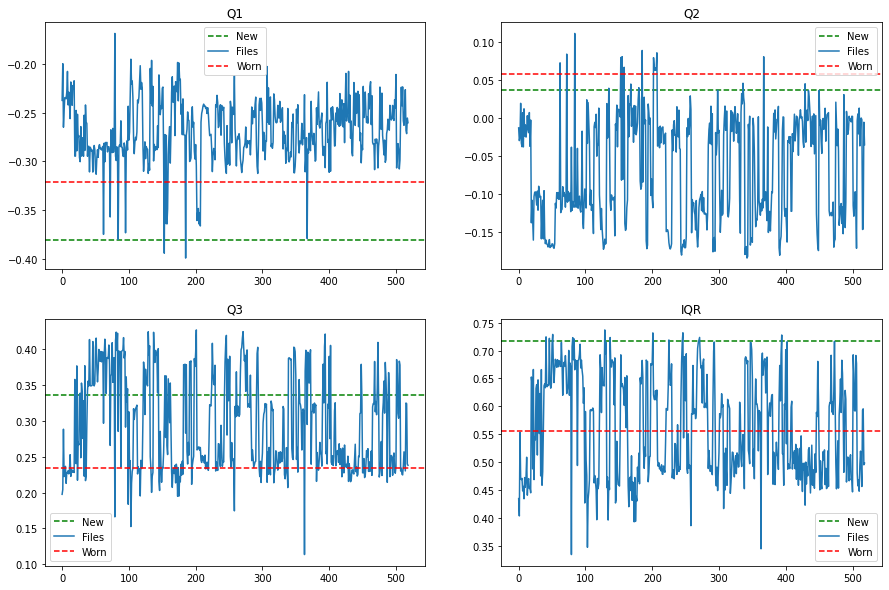

In [51]:
# plotting q1, q2, q3, iqr wrt new and old blade
# visulaising descriptive stats
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 1. q1
axes[0][0].axhline(y=new_q1, color='green', linestyle='--')
axes[0][0].plot(q1)
axes[0][0].axhline(y=worn_q1, color='red', linestyle='--')
axes[0][0].legend(['New', 'Files', 'Worn'])
axes[0][0].title.set_text('Q1')

# 2. q2
axes[0][1].axhline(y=new_q2, color='green', linestyle='--')
axes[0][1].plot(q2)
axes[0][1].axhline(y=worn_q2, color='red', linestyle='--')
axes[0][1].legend(['New', 'Files', 'Worn'])
axes[0][1].title.set_text('Q2')

# 3. q3
axes[1][0].axhline(y=new_q3, color='green', linestyle='--')
axes[1][0].plot(q3)
axes[1][0].axhline(y=worn_q3, color='red', linestyle='--')
axes[1][0].legend(['New', 'Files', 'Worn'])
axes[1][0].title.set_text('Q3')

# 4. iqr
axes[1][1].axhline(y=new_iqr, color='green', linestyle='--')
axes[1][1].plot(iqr)
axes[1][1].axhline(y=worn_iqr, color='red', linestyle='--')
axes[1][1].legend(['New', 'Files', 'Worn'])
axes[1][1].title.set_text('IQR') 

plt.show()

<b>Comparing corelation b/w Speed and Torque for each file wrt new and worn blade</b>

In [28]:
wb = worn_blade['CutActualSpeed'].corr(worn_blade['CutMotorTorque'])
nb = new_blade['CutActualSpeed'].corr(new_blade['CutMotorTorque'])
correlation = []
for file in files:   
    df = pd.read_csv(file)
    df.rename(columns={"timestamp":"Time Elapsed",
                         "pCut::Motor_Torque":"CutMotorTorque",
                         "pCut::CTRL_Position_controller::Lag_error": "CutLagError",
                         "pCut::CTRL_Position_controller::Actual_position" :"CutActualPosition",
                         "pCut::CTRL_Position_controller::Actual_speed":"CutActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Actual_position":"FilmActualPosition",
                         "pSvolFilm::CTRL_Position_controller::Actual_speed":"FilmActualSpeed",
                         "pSvolFilm::CTRL_Position_controller::Lag_error":"FilmLagError",
                         "pSpintor::VAX_speed":"VAXSpeed"},
                inplace=True)
    val = df['CutActualSpeed'].corr(df['CutMotorTorque'])
    correlation.append(val)

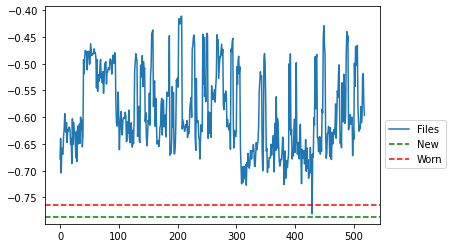

In [50]:
plt.plot(correlation)
plt.axhline(y=nb, color='green', linestyle='--')
plt.axhline(y=wb, color='red', linestyle='--')
plt.legend(['Files', 'New', 'Worn'],bbox_to_anchor=(1, 0.5))
plt.show()